# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), and so you have four options:
1. Use PaperSpace [as suggested for CW1](https://hackmd.io/@afspies/S1stL8Qnt)
2. Use Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
3. Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
4. Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is 19:00, Friday 25th February, 2022** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'afs219' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':

    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_cw_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':

    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

Mounted at /content/drive/


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 10
learning_rate = 0.001
batch_size = 128
latent_dim = 20 # Choose a value for the size of the latent space
beta = 3

# Additional Hyperparameters 
bce_loss = nn.BCELoss(reduction="sum")

#additional inputs
image_size = 28*28

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
    lambda x : x.round() # binarise the inputs
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
print( os.getcwd() )
# print( os.listdir('data') )

/content


### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        self.conv1_encode = nn.Sequential(
        nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
        nn.BatchNorm2d(32))

        self.conv2_encode = nn.Sequential(
        nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
        nn.BatchNorm2d(64))

        self.conv3_encode = nn.Sequential(
        nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
        nn.BatchNorm2d(128))

        self.conv4_encode = nn.Sequential(
        nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
        nn.BatchNorm2d(256))


        self.fc_mu = nn.Linear(256*2*2, latent_dim)
        self.fc_logvar = nn.Linear(2*2*256, latent_dim)


        self.decode_fc = nn.Linear(latent_dim, 256*2*2)
        self.deconv1_decode = nn.Sequential(
        nn.ConvTranspose2d(256, 128, 3, 2, 1, 1),
        nn.BatchNorm2d(128))

        self.deconv2_decode = nn.Sequential(
        nn.ConvTranspose2d(128, 64, 3, 2, 1, 1),
        nn.BatchNorm2d(64))

        self.deconv3_decode = nn.Sequential(
        nn.ConvTranspose2d(64, 32, 3, 2, 1,0),
        nn.BatchNorm2d(32))
        self.deconv4_decode = nn.ConvTranspose2d(32, 1, 2, 2, 1)


        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.conv1_encode(x)
        x = F.relu(x)
        x = self.conv2_encode(x)
        x = F.relu(x)
        x = self.conv3_encode(x)
        x = F.relu(x)
        x = self.conv4_encode(x)
        x = F.relu(x)
        # x = self.conv5_encode(x)
        # x = F.relu(x)

        x = x.view(x.shape[0], -1) # flatten for the input of FC layers
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        stdev = torch.exp(logvar/2)
        eps = torch.rand_like(stdev) # stochastic input sampled from N(0,1)
        return mu + eps * stdev
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        z = self.decode_fc(z)
        # reshape to feed into conv
        z = z.view(-1, 256, 2, 2)

        z = self.deconv1_decode(z) # shape (b, 64, 14, 14)
        z = F.relu(z)

        z = self.deconv2_decode(z) # shape (batch, 32, 28, 28)
        z = F.relu(z)

        z = self.deconv3_decode(z) # shape (batch, 1, 28, 28)
        z = F.relu(z)
        z = self.deconv4_decode(z)
        decoded_image = torch.sigmoid(z)
        return decoded_image
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        x_hat = self.decode(z)
        return x_hat, mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 839177
VAE(
  (conv1_encode): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2_encode): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3_encode): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv4_encode): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (fc_mu): Linear(in_features=1024, out_features=20, bias=True)
  (fc_logvar): Linear(in_features=1024, out_features=20, bias=True)
  (decode_fc): Linear(in_feat

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        reconstruction_loss = F.binary_cross_entropy(recon_x, x, reduction="sum")
        K_L_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
        loss = reconstruction_loss + beta*K_L_divergence
        return loss, reconstruction_loss, K_L_divergence
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model.train()
# <- You may wish to add logging info here
train_loss = []
train_KL = []
train_BC = []

test_loss = []
test_KL = []
test_BC = []
for epoch in range(num_epochs):  
    # <- You may wish to add logging info here
    running_loss = 0 
    running_RL  = 0
    running_KLD = 0
    count_batch = 0

    model.train()
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):   
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            data = data.to(device)#None # Need at least one batch/random data with right shape -
                        # This is required to initialize to model properly below
                        # when we save the computational graph for testing (jit.save)
            recon_x, mu, logvar = model(data)
            loss, rec_loss, KL_div = loss_function_VAE(recon_x, data, mu, logvar, beta)
            
            #aggregate losses for plotting
            running_loss += loss.item()
            running_RL += rec_loss.item()
            running_KLD += beta * KL_div.item()
            
            # perform one step of gradient descent and parameters update
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            count_batch +=data.shape[0]
            #######################################################################
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/len(data))

    # print(f"Loss: {loss}, Train Loss: {running_loss}, Count: {count_batch}, Total: {running_loss/count_batch}")
    print(f"Loss: {loss}, Train Loss: {train_loss}, Count: {len(train_dat)}, Total: {running_loss/len(train_dat)}")
    train_loss.append(running_loss/len(train_dat))
    train_KL.append(running_KLD/len(train_dat))
    train_BC.append(running_RL/len(train_dat))

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')
    # Save test loss
    model.eval()
    running_test_loss = 0
    running_test_RL_loss = 0
    running_test_KLD_loss = 0

    count_batch = 0
    with torch.no_grad():
        with tqdm.tqdm(loader_test, unit="batch") as tepoch: 
            for batch_idx, (data, _) in enumerate(tepoch):   
                #######################################################################
                #                       ** START OF YOUR CODE **
                #######################################################################
                data = data.to(device) # -1, image_H*image_W) 
                            # Need at least one batch/random data with right shape -
                            # This is required to initialize to model properly below
                            # when we save the computational graph for testing (jit.save)

                optimizer.zero_grad()
                recon_x, mu, logvar = model(data)
                loss, rec_loss, KL_div = loss_function_VAE(recon_x, data, mu, logvar, beta)

                #aggregate losses for plotting
                running_test_loss += loss.item()
                running_test_RL_loss += rec_loss.item()
                running_test_KLD_loss += beta * KL_div.item()
                count_batch+=data.shape[0]
                #######################################################################
                #                       ** END OF YOUR CODE **
                ####################################################################### 
                if batch_idx % 20 == 0:
                    tepoch.set_description(f"Epoch {epoch}")
                    tepoch.set_postfix(loss=loss.item()/len(data))

        print(f"Loss: {loss}, Test Loss: {running_test_loss}, Count: {count_batch}, Total Test: {running_test_loss/count_batch}")
        test_loss.append(running_test_loss/len(test_dat))
        test_KL.append(running_test_KLD_loss/len(test_dat))
        test_BC.append(running_test_RL_loss/len(test_dat))

Epoch 0: 100%|██████████| 469/469 [00:10<00:00, 46.20batch/s, loss=94.6]


Loss: 9441.2421875, Train Loss: [], Count: 60000, Total: 150.82815743815104


Epoch 0: 100%|██████████| 79/79 [00:01<00:00, 68.40batch/s, loss=97.9]


Loss: 1440.381591796875, Test Loss: 972549.0593261719, Count: 10000, Total Test: 97.25490593261719


Epoch 1: 100%|██████████| 469/469 [00:09<00:00, 48.18batch/s, loss=89.1]


Loss: 8484.427734375, Train Loss: [150.82815743815104], Count: 60000, Total: 90.37078118489583


Epoch 1: 100%|██████████| 79/79 [00:01<00:00, 64.03batch/s, loss=90.2]


Loss: 1270.2779541015625, Test Loss: 880785.4068603516, Count: 10000, Total Test: 88.07854068603515


Epoch 2: 100%|██████████| 469/469 [00:10<00:00, 46.75batch/s, loss=84.8]


Loss: 7946.802734375, Train Loss: [150.82815743815104, 90.37078118489583], Count: 60000, Total: 84.795057421875


Epoch 2: 100%|██████████| 79/79 [00:01<00:00, 64.34batch/s, loss=84.3]


Loss: 1175.74951171875, Test Loss: 818557.7221679688, Count: 10000, Total Test: 81.85577221679688


Epoch 3: 100%|██████████| 469/469 [00:09<00:00, 47.57batch/s, loss=79.5]


Loss: 7461.0341796875, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875], Count: 60000, Total: 82.18378531901041


Epoch 3: 100%|██████████| 79/79 [00:01<00:00, 63.34batch/s, loss=80.9]


Loss: 1172.81298828125, Test Loss: 804488.1059570312, Count: 10000, Total Test: 80.44881059570312


Epoch 4: 100%|██████████| 469/469 [00:10<00:00, 45.69batch/s, loss=78.1]


Loss: 7794.17919921875, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041], Count: 60000, Total: 80.5974167561849


Epoch 4: 100%|██████████| 79/79 [00:01<00:00, 65.97batch/s, loss=78.8]


Loss: 1113.55810546875, Test Loss: 790326.2514648438, Count: 10000, Total Test: 79.03262514648438


Epoch 5: 100%|██████████| 469/469 [00:10<00:00, 43.94batch/s, loss=81.1]


Loss: 7492.87890625, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041, 80.5974167561849], Count: 60000, Total: 79.3714561360677


Epoch 5: 100%|██████████| 79/79 [00:01<00:00, 67.56batch/s, loss=78.5]


Loss: 1226.408935546875, Test Loss: 783652.0866699219, Count: 10000, Total Test: 78.36520866699219


Epoch 6: 100%|██████████| 469/469 [00:09<00:00, 47.23batch/s, loss=80.8]


Loss: 7487.0869140625, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041, 80.5974167561849, 79.3714561360677], Count: 60000, Total: 78.49276022135416


Epoch 6: 100%|██████████| 79/79 [00:01<00:00, 65.85batch/s, loss=79.5]


Loss: 1156.790283203125, Test Loss: 777546.2932128906, Count: 10000, Total Test: 77.75462932128906


Epoch 7: 100%|██████████| 469/469 [00:09<00:00, 47.45batch/s, loss=78.2]


Loss: 7705.544921875, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041, 80.5974167561849, 79.3714561360677, 78.49276022135416], Count: 60000, Total: 77.84053304036458


Epoch 7: 100%|██████████| 79/79 [00:01<00:00, 66.89batch/s, loss=77.3]


Loss: 1177.3013916015625, Test Loss: 770346.6890869141, Count: 10000, Total Test: 77.0346689086914


Epoch 8: 100%|██████████| 469/469 [00:10<00:00, 46.82batch/s, loss=80.1]


Loss: 7278.2236328125, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041, 80.5974167561849, 79.3714561360677, 78.49276022135416, 77.84053304036458], Count: 60000, Total: 77.28756344401042


Epoch 8: 100%|██████████| 79/79 [00:01<00:00, 64.35batch/s, loss=76.1]


Loss: 1149.986572265625, Test Loss: 771192.3498535156, Count: 10000, Total Test: 77.11923498535157


Epoch 9: 100%|██████████| 469/469 [00:10<00:00, 46.57batch/s, loss=76.3]


Loss: 7576.73876953125, Train Loss: [150.82815743815104, 90.37078118489583, 84.795057421875, 82.18378531901041, 80.5974167561849, 79.3714561360677, 78.49276022135416, 77.84053304036458, 77.28756344401042], Count: 60000, Total: 76.74030928548177


Epoch 9: 100%|██████████| 79/79 [00:01<00:00, 62.33batch/s, loss=77.7]

Loss: 1102.3421630859375, Test Loss: 763656.5736083984, Count: 10000, Total Test: 76.36565736083985


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here

**YOUR ANSWER**
Loss choice: Binary Cross Entropy Loss + beta * KL divergence

The VAE Prior choice: a multivariate Normal distribution N(0,1). The optimisation algorythm was built in such a way that will encourage the encoder to map the training data around the standard normal. The choice of this distribution was dictated by its wide practical use due to convenience in calculations. In particular, please find below advantages of using this distribution for the latent variables:


*   Analytical evaluation of the KL divergence in 
the variational loss
*   Reparametrisation trick can be applied easily for efficient gradient calculations
*   Easy generation of samples in the latent space 
*   With a prior modelled as Gaussian, then multiplying it by the lielyhood term will generate a posterior distribution which is also Gaussian

The reconstruction loss - mapping from Z to data X - binary cross entropy relates to the output data domain
*   the expected value of the log likelyhood assumes we are calculating a negative cross entropy between the original data and the reconstructed data
*   I pre-process the data to make inputs Bernoulli by binarising the data. thus x follows a Ber(p) distribution
*   the output data is constrained to be between 0 and 1 after a sigmoid activation function is applied in the last layer of the VAE decoder
*   thus we can calculate the expected value of a log probability as:
x*log(x_hat) + (1-x)*log(1-x_hat)
*   Importantly in the implementation of the bce loss I specified that the reduction = "sum", as we want to take the sum of all the errors across the batch samples. "Sum" rather than "mean" reduction is used to have it consisten with the implemented KL divergence term which has a summation across the samples in the batch 

Disentanglement in the latent space:
A latent space z is disentangled if latent variable is 'controlling' one generative factor in the data and is relatively insensitive to other factors. 
The level of dientanglement is controlled by the parameter beta in the VAE loss. Beta controls the trade-off between generaisation and reconstruction quality. I have experimented with a range of beta, and have found that beta =3 to yield a good balance between the 2 losses which optimise.

*   higher beta increases the weight on the regularisation ( minimisation of the difference between Q(z/x) and the latent distribution P(z), which is Normal in this case.
*   lower beta implies that the reconstruction loss dominated and there is less restriction on the latent space
  *   if we remove/make very small regularization loss, the model will produce very narrow distribution. This defeats the purpose of the VAE.
  *   we want the network to learn a wide distribution with a wide variance so we can sample more values







<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

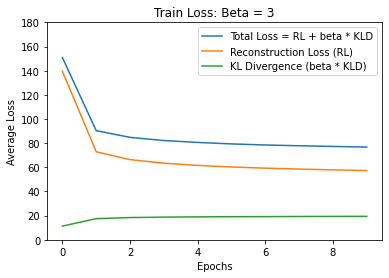

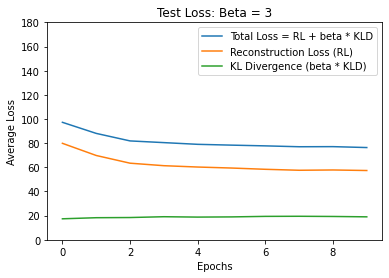

In [ ]:
# # *CODE FOR PART 1.2a IN THIS CELL*


# Plotting train loss curves:

epochs = [i for i in range(num_epochs)]
plt.figure()
plt.title(f"Train Loss: Beta = {beta}")
plt.plot(epochs, train_loss, label=f"Total Loss = RL + beta * KLD")
plt.plot(epochs, train_BC, label=f"Reconstruction Loss (RL)")
plt.plot(epochs, train_KL, label=f"KL Divergence (beta * KLD)")
plt.xlabel("Epochs")
plt.ylabel("Average Loss")

plt.ylim([0, 180])
plt.legend()
plt.savefig(f'/content/drive/MyDrive/dl_cw_2/CW_VAE/train_losses_beta_{str(beta)}.jpg')

# Plotting test loss curves:
epochs = [i for i in range(num_epochs)]
plt.figure()
plt.title(f"Test Loss: Beta = {beta}")
plt.plot(epochs, test_loss, label=f"Total Loss = RL + beta * KLD")
plt.plot(epochs, test_BC, label=f"Reconstruction Loss (RL)")
plt.plot(epochs, test_KL, label=f"KL Divergence (beta * KLD)")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Average Loss")
plt.ylim([0, 180])
plt.savefig(f'/content/drive/MyDrive/dl_cw_2/CW_VAE/test_losses_beta_{str(beta)}.jpg')

**Train loss Beta = 0.1**

<img src="https://drive.google.com/uc?id=10-xa1Td7LiJvpI9Sr5PIgtNFZnrsXvlz">


**Test loss Beta = 0.1**

<img src="https://drive.google.com/uc?id=1-z9I2_X2BKL5JM74agwkEzI2T0KXIAeJ">

**Train loss Beta = 10**

<img src="https://drive.google.com/uc?id=1-P0F1BQAJN72htxP3u4fN_J6bdVxKba2">

**Test loss Beta = 10**

<img src="https://drive.google.com/uc?id=1-JeFZYOlCZA0yAn060zmeiye5uHCZwFG">




## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


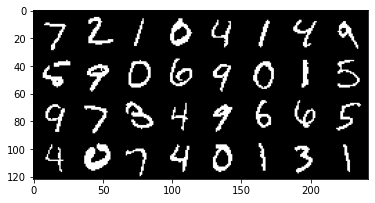

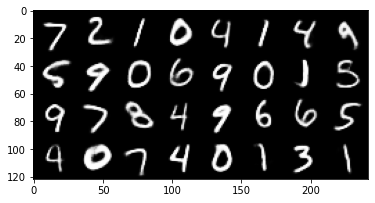

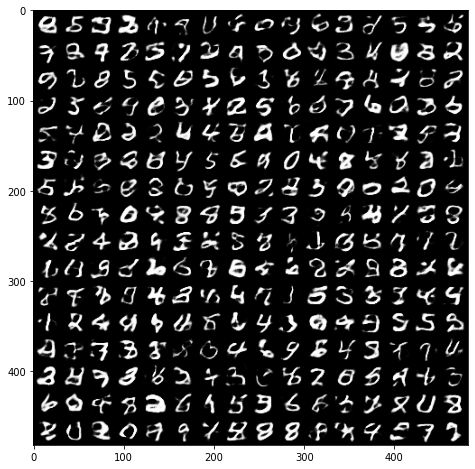

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, _, _ = model(fixed_input.to(device))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

***What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)? Can you intuitively explain if this behaviour is desirable? ***

The **reconstruction loss decreases** during training - a proof that the **reconstructed images are matching closely the input images**. This further implies the latent space has "correctly" mapped different classes to distinct clusters.

The **KL** divergence loss **increases only slightly in the first 2 epochs** and is more than offset by a much larger fall in the reconstruction loss. Afterwards the **KL diverfence loss remains stable** for the remaining duration of training. 

A slight uptick in the loss can be related to the fact that the shape of the posterior changes as more information is encoded into the latent space.  KL divergence loss acts as a **regulariser of the latent space,** and exhibits much smaller absolute loss compared to the reconstruction loss. Due to the **closed form solution of the KL loss** it is not surprising that it stabilises rather early in the training. For higher beta's beta*KL divergence loss naturally becomes a higher percentage of the total loss.

***What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)?***

Posterior collapse results from **betas** which are so **high** that the **posterior distribution is infinitely close to the N(0,I)** and the **latent space becomes uninformative.** As a result we observe poor results for both reconstruction images and generated images. An example of posterior collapse is evidenced in the pictures below with beta = 100. Classes are broadly limited to 0, 6, 8.
I have also experienced a posterior collapse when I was building the encoder/decoder architecture with decoder architecture being less "sophisticated" then the encoder ones. Although reconstruction images were still somewhat correct, the model failed to generate many distinct classes out of the latent space.


**Beta = 100 Reconstructed Images**

<img src="https://drive.google.com/uc?id=19O-j0wVTgWZ6wQm2oqNrbZNW7nag3t0_">


**Beta = 100 Generated Images**

<img src="https://drive.google.com/uc?id=1s4FUXMPq7zPA5FPG8grxB4w2Jfx08tQx">

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
# *CODE FOR PART 1.3a IN THIS CELL
import pandas as pd
from sklearn.manifold import TSNE

test_dataloader = DataLoader(test_dat, batch_size=10000, shuffle=False)
# get latent representaiton z

with torch.no_grad():
  test_images, test_labels = next(iter(test_dataloader))

  test_images = test_images.to(device)
  mu, logvar = model.encode(test_images)
  z = model.reparametrize(mu, logvar)
  z = z.cpu()
  z = z.detach().numpy()
  z_embedded = TSNE(n_components=2, verbose=True).fit_transform(z)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 2.163s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.958774
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.200401
[t-SNE] KL divergence after 1000 iterations: 2.210454


In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

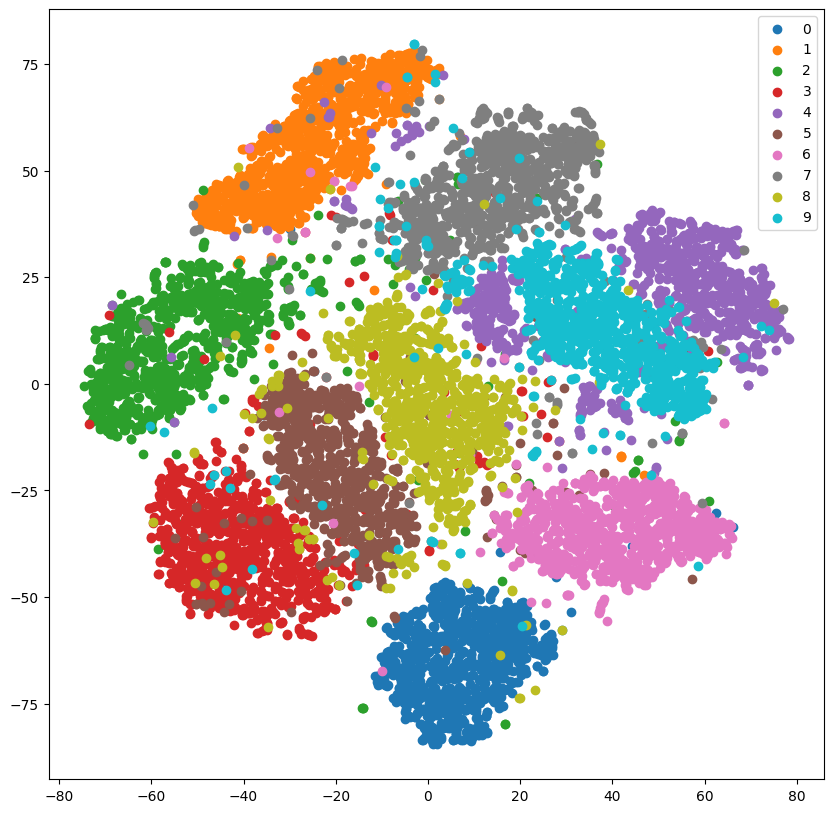

In [ ]:
# Custom Visualizations
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)


fig, ax = plt.subplots(figsize=(10,10))
for digit in np.unique(test_labels):
  idx = np.where(test_labels == digit)
  ax.scatter(z_embedded[idx,0], z_embedded[idx,1], label=digit)
ax.legend()
plt.savefig(f'/content/drive/MyDrive/dl_cw_2/CW_VAE/TSNE_matplotlib_{str(beta)}.jpg')

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

**I have looked at the structure of the T_SNE plot for different sets of beta. Key findings:**


*   As **beta increases** the **distance between clusters decreases**. This is a result of the **higher weigh**t put on the **regularisation term** - KL divergence. Higher beta pushes all clusters together towards a single cluster as it minimises the KL stance between the probability of z|x and a posterior distribution p(z) which we chose to be standard Gaussian. The **reconstruction images are blury** because it essentially represents the **intersection of all the digits.**

  *   In the **extreme case of beta** = 20 and higher  **posterior distribution collapses** and our embedded data becomes **one cluster** - all dots are blurred together. (Please refer to a plot below for beta = 100)
*   As **beta decreases** the **distance between clusters increases** and the boundaries between different classes are more distinct. This is a direct result of the model not "forcing" z distribution to be "close" to Gaussian distribution. (Please refer to a plot below for beta = 0.1)

  *   Far **fewer outliers** are observed for models with **small beta weight**, as we relax the requirement for classes to be constructed close together. The reconstruction performace is enhanced by it.

  *   However, as we have **more "discontinuity"** in the z-space results in the **weaker ability to generate samples**.


*   If we look at the TSN for beta = 3 we can see that on the boundaries between clusters one digit "transforms" into another digit. These boundaries exist because there are some ways of writing these digits that are ambigious. For example a 1 that looks like a 7 or a 3 that looks like an 8.

*   For beta=3 I observe that 8s and 4s have most outliers - and are mixed up for other classes.

**Is TSNE reliable?**


*   T-SNE results are hihgly sensitive to the a tuneable parameter, perplexity.
*   To increase the interpretability and reliability of our conclusions we would need to analyse multiple plots with different perplexities.
*   In particular, different perplexities will have a direct change **on cluster sizes, shapes and the distance between clusters** 

**Beta = 100**

<img src="https://drive.google.com/uc?id=1-rNJE_mktjK3ulkhpG1Oh_jUV92O1WBh">


**Beta = 0.1**
<img src="https://drive.google.com/uc?id=100j9H1bn96s6rVnj7Q0hHWVhUYIYN6sN">


## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


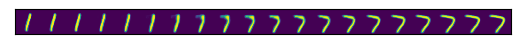

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
def interpolate(autoencoder, x_1, x_2, n=12):
    mu_1, logvar_1 = model.encode(x_1.to(device))
    mu_2, logvar_2 = model.encode(x_2.to(device))
    z_1 = model.reparametrize(mu_1, logvar_1)
    z_2 = model.reparametrize(mu_2, logvar_2)

    z = torch.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])
    interpolate_list = autoencoder.decode(z)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()

    w = 28
    img = np.zeros((w, n*w))
    for i, x_hat in enumerate(interpolate_list):
        img[:, i*w:(i+1)*w] = x_hat.reshape(28, 28)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

test_dataloader3 = DataLoader(test_dat, batch_size=10000, shuffle=False)
model.eval()

x, y = test_dataloader3.__iter__().next()
x_1 = x[y == 1][1].to(device) 
x_2 = x[y == 7][1].to(device) 
x_1 = x_1.unsqueeze(0)
x_2 = x_2.unsqueeze(0)

x_3 = x[y == 6][1].to(device) 
x_4 = x[y == 7][1].to(device) 
x_3 = x_3.unsqueeze(0)
x_4 = x_4.unsqueeze(0)

interpolate(model, x_1, x_2, n=20)

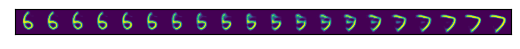

In [ ]:
interpolate(model, x_3, x_4, n=20)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

I have looked at interpolations between 2 sets of numbers with one set having clusters at a shorter distance than the other.


*   The first set was 1 and 7, clusters are close-distanced. We see a very smooth interpolation as 1 and 7 "have a common border" in the latent space.
*   The second set was 6 and 7, clusters are more widely distanced. I see a less smooth interpolation with 6 first "migrating" into 9 and then 9 "migrating" into 7.
*   If **beta** is chosen to be **very small**, we do not see a very interpretable number in the middle of the interpolation as T-SNE shows **large discontinuity between clusters**.
*   Higher beta (but not too high to cause posterior collapse) increases the interpolation efficiency, and readability between numbers.


**Interpolation between 6 and 7 Beta = 10**

<img src="https://drive.google.com/uc?id=1nLaZtfMdiYMWQehnmkXXUs5Dd13Uasdg">

**Interpolation between 6 and 7 Beta = 0.1**

<img src="https://drive.google.com/uc?id=1C8W6z9sFT15-O7rZJHQPBorWqr9P8r3q">






# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [5]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = (x+1)/2 #unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [6]:
batch_size =  128
image_size = 32
transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transforms.Compose([
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transforms.Compose([
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data/
Files already downloaded and verified


We'll visualize a subset of the test set: 

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


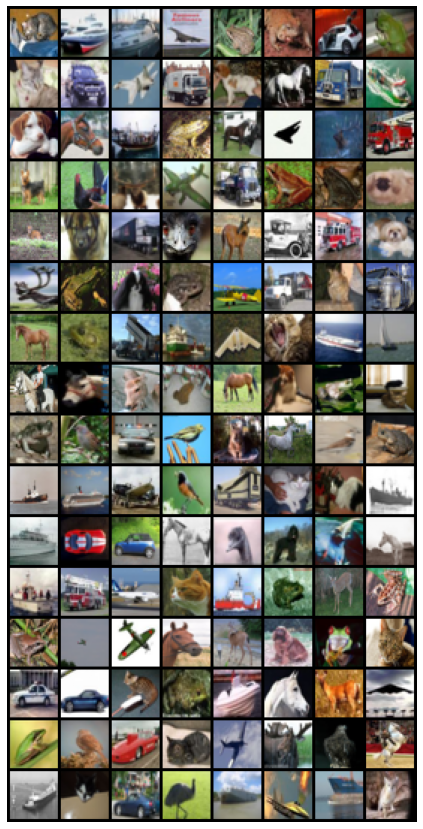

In [7]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [8]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.
num_epochs = 25
learning_rate = 0.00015
latent_vector_size = 100

# Other hyperparams
g_fmaps_size = 64
d_fmaps_base_size = 64
# weight_decay_d = 0.001
# lr_decay_g = 0.98
# lr_decay_d = 0.89

In [9]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_vector_size, g_fmaps_size*8, 4, 1, 0, bias = False),
            nn.BatchNorm2d(g_fmaps_size*8), 
            nn.ReLU(True),
            # state size = (fm_size*8) x 4 x 4
            nn.ConvTranspose2d(g_fmaps_size*8, g_fmaps_size*4, 4, 2, 1, 0, bias = False),
            nn.BatchNorm2d(g_fmaps_size*4),
            nn.ReLU(True),
            # state size = (fm_size*4) x 8 x 8
            nn.ConvTranspose2d(g_fmaps_size*4, g_fmaps_size*2, 4, 2, 1, 0, bias = False),
            nn.BatchNorm2d(g_fmaps_size*2),
            nn.ReLU(True),
            # state size = (fm_size*2) x 16 x 16
            # out_channels = 3 due to colored image
            nn.ConvTranspose2d(g_fmaps_size*2, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size = 3 x 32 x 32

        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.main = nn.Sequential(
            # input 3 x 32 x 32
            nn.Conv2d(3, d_fmaps_base_size, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (d_fmaps_base_size) x 16 x 16
            nn.Conv2d(d_fmaps_base_size, d_fmaps_base_size*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_fmaps_base_size*2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size = d_fm_base *2 x = 8 x 18
            nn.Conv2d(d_fmaps_base_size*2, d_fmaps_base_size*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_fmaps_base_size*4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size = (d_fm_base *4) x 4 x 4
            nn.Conv2d(d_fmaps_base_size*4, d_fmaps_base_size*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_fmaps_base_size*8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size = (d_fm_base *8) x 1 x 1
            nn.Conv2d(d_fmaps_base_size*8, 1, 4, 1, 1, bias=False),
            nn.Sigmoid()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [10]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [11]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448576
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2765568
Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1,

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [12]:
# You can modify the arguments of this function if needed
bce_loss = nn.BCELoss()
# bce_loss_logit = nn.BCEWithLogitsLoss()
def loss_function(out, target_label):
    loss = bce_loss(out, target_label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [13]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))


# optimizerD = torch.optim.Adam(model_D.parameters(), lr=lr_decay_d, betas=(beta1, 0.999), weight_decay=weight_decay_d)
# optimizerG = torch.optim.Adam(model_G.parameters(), lr=lr_decay_g, betas=(beta1, 0.999))
schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=2, gamma=0.95)
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=2, gamma=0.90)

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [14]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [15]:
train_losses_G = []
train_losses_D = []
train_losses_D_real = []
train_losses_D_fake = []
train_losses_G_e = []
train_losses_D_e = []
# # labels 
# ones_labels = torch.ones(batch_size, 1)
# zeros_labesl = torch.ones(batch_size, 1)

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    train_loss_D_real = 0
    train_loss_D_fake = 0
    train_loss_G = 0
    train_loss_D = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        for i, data in enumerate(tepoch):
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            
            # train with real
            real_cpu = data[0].to(device)
            n = real_cpu.size(0) # get batch size
      
            ones_labels = torch.ones(n).to(device)
            # print(data.shape)
            real_images = model_D(real_cpu)
            D_x = real_images.mean().item()
            # print(real_images.shape)

            d_loss_real = loss_function(real_images.view(-1), ones_labels)
            train_loss_D_real += d_loss_real.item()
            # train with fake
            noise = torch.randn(n, latent_vector_size, 1, 1).to(device)
            zeros_labels = torch.zeros(n).to(device)
            fake_images_generated = model_G(noise)
            # print(fake_images_generated.shape)
            fake_images_output = model_D(fake_images_generated.detach())
            # print(fake_images_output.shape)
            d_loss_fake = loss_function(fake_images_output.view(-1), zeros_labels)
            train_loss_D_fake += d_loss_fake.item()
            D_G_z1 = fake_images_output.mean().item()
            # gradient descent
            errD = (d_loss_real + d_loss_fake) / 2
            optimizerD.zero_grad()
            optimizerG.zero_grad()
            errD.backward()
            optimizerD.step()


            # (2) Update G network: maximize log(D(G(z)))
            for _ in range(2):  
              noise = torch.randn(n, latent_vector_size, 1, 1).to(device)
              ones_labels = torch.ones(n,1,1,1).to(device)
              fake_images_generated = model_G(noise)
              fake_images_output = model_D(fake_images_generated)
              D_G_z2 = fake_images_output.mean().item()
              errG = loss_function(fake_images_output, ones_labels)
              
              optimizerG.zero_grad()
              optimizerD.zero_grad()
              errG.backward()
              optimizerG.step()
              

            train_losses_G.append(errG.item())
            train_losses_D.append(errD.item())
            train_loss_D += errD.item()
            train_loss_G += errG.item()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), content_path/'CW_GAN/fake_samples_epoch_%03d.png' )#% epoch)

    # schedulerD.step()
    # schedulerG.step()
    train_losses_D_e.append(train_loss_D / len(loader_train))
    train_losses_G_e.append(train_loss_G / len(loader_train))
    train_losses_D_fake.append(train_loss_D_fake / len(loader_train))
    train_losses_D_real.append(train_loss_D_real / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Epoch 24: 100%|██████████| 391/391 [00:58<00:00,  6.70batch/s, D_G_z=0.216/0.225, D_x=0.678, Loss_D=0.338, Loss_G=1.75]


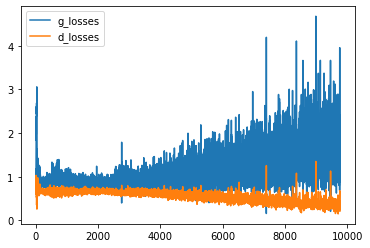

In [16]:
plt.plot(train_losses_G, label='g_losses')
plt.plot(train_losses_D, label='d_losses')
plt.legend()


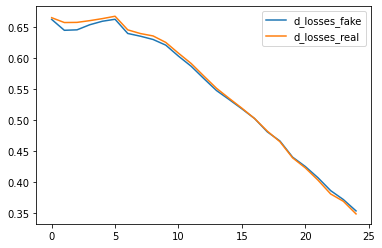

In [17]:
plt.plot(train_losses_D_fake, label='d_losses_fake')
plt.plot(train_losses_D_real, label='d_losses_real')
plt.legend()

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


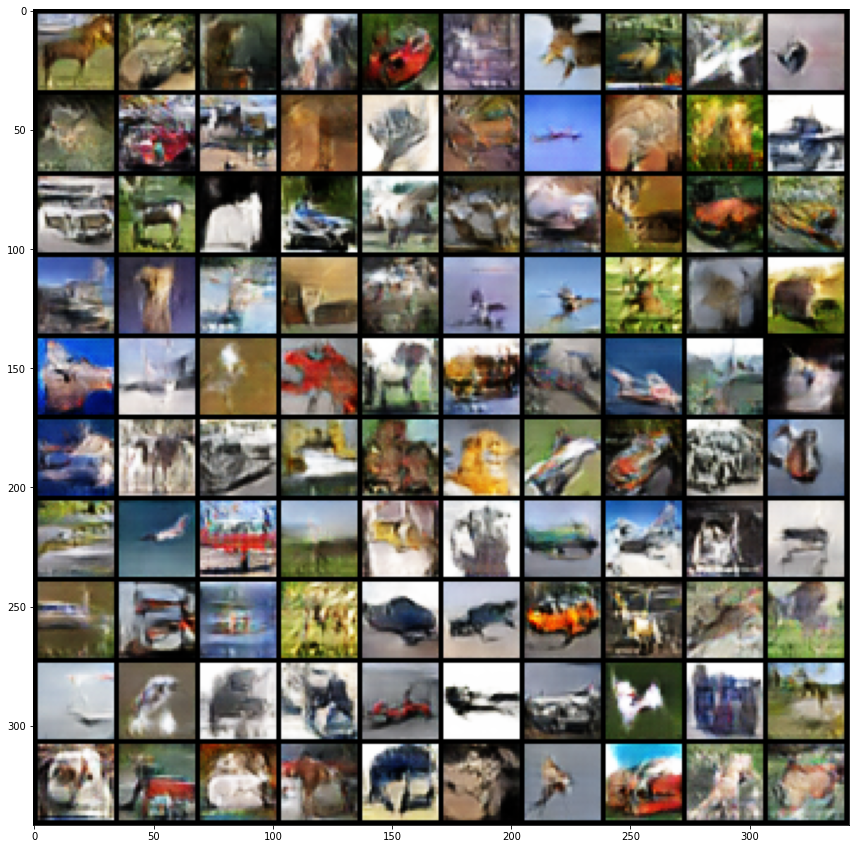

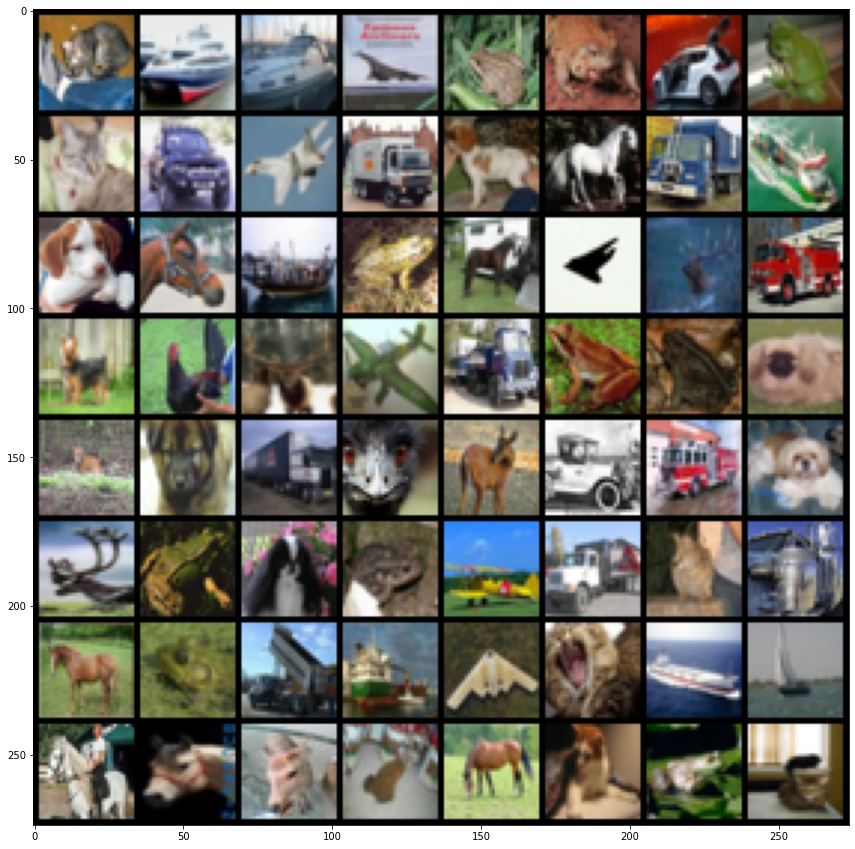

In [18]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

I started by implemeting the **DCGAN architecture** per the original paper with hyperparameters set to the same as in the paper. I chose it due to strong reported results in the paper. The most differentiating features from the paper were as follows:

*   **All convolutional network** - no fully conneced layers

  *   there is a series of convolutional layers and no pooling, downsampling is achieved by using a stride length higher than 1. This is computationally more effective 

*   **Batchnorm** was used to normalise data adaptively at each layer and allowed gradient to propogate into deeper models/

*   **Leaky RELU** was used for the discriminator but a normal Leaky Relu was used for the generator, which **solves the problem of "dead neurons"** and hopefully improve the learning signal.

*   **Tanh activation** added at the end of the Generator, which researchers found yielded better results (accordingly I amended denorm function such that the (-1,1) pixel range from the tanh activation transforms back to (0,1) range)

I set the hyperparameters per the paper (lr = 0.0002, batch size 128, weight intialisation zero centred normal distribution, leaky relu slope 0.2). With 22m total parameters I have observed a failure of the model (please refer to graphs below). I tried to normalise the model by using BCElogitloss which would "neutralise" the exponential from the sigmoid funtion in the last layer and logarith in the BCE loss. Logs of losses between the Generator and Discriminator became of similar magnitude but the end result for the image generation remained very poor. Perhaps I should have trained that model beyond 30 epochs.

I reverted to a simpler model with far fewer parameters and with relatively balanced generator vs descriminator architecture. The results were better for such "less-deep" model. I noticed that the generator is harder to optimise than the discriminator. One of the main driver of better performance was that the generator was trained to be more marginally more "powerful" then the generator, which was achieved by:


*   doing **multiple training steps for the generator** (2 in my code) for **each single step** of the discriminator 
*   making infrastructure of the Generator more powerful with the **ratio of Generator to Discriminator parameters of c.1.3**.


With the aforementioned engineering choices and c.6m parameters I have observed better results, however pictures were not very clear still and I noticed a significant divergence in the Generator and Descriminator losses pass epoch 15.

I tried to contain losses divergence by setting a **lower learning rate for the Discriminator**, which did not yield positive result. Probably because training Generator 2x per every gradient descent optimisation is already equivalent to it. I have **introduced a scheduler** with a very slow learning decay and set a learning decay higher for the generator, however I have not observed any visible improvements, and saw some large spikes in training losses.

As my model was not very deep I still wanted to improve the quality of pictrue by training it more. Setting a **learning rate** slightly lower than in the paper to 0.00015 for both generator and discriminators seem to have worked. The final quality of my output became clearer with more distinct classes obsevable and **training epochs extended to 25**.


**Losses diverging:**

<img src="https://drive.google.com/uc?id=1S1no3GcU4ayonJjG0AsP1oETCPszWcBt">


**Failure to converge - 22m params** (the image does not look bright as at that point I have not used the right formula to demorm the image to be between -1 and 1 (to match tanh))

<img src="https://drive.google.com/uc?id=1lE0rrYUkTgvKDklPhYwIeMZPKzl2ehq3">



**Mode collapse**

<img src="https://drive.google.com/uc?id=1weteqJYUVPQFZofIfnZI0QohY-oDlvL2">


## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

Text(0.5, 0, 'Iterations')

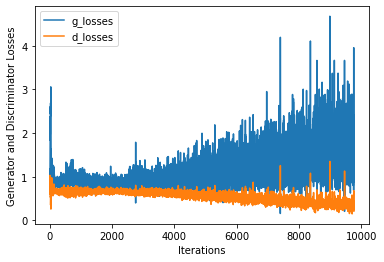

In [19]:
# ANSWER FOR PART 2.2 IN THIS CELL*
plt.plot(train_losses_G, label='g_losses')
plt.plot(train_losses_D, label='d_losses')
plt.legend()
plt.ylabel("Generator and Discriminator Losses")
plt.xlabel("Iterations")

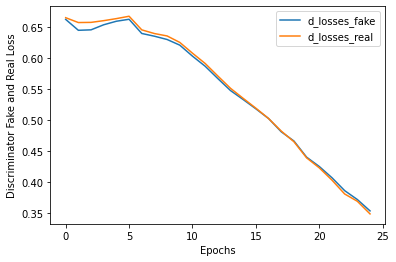

In [20]:
plt.plot(train_losses_D_fake, label='d_losses_fake')
plt.plot(train_losses_D_real, label='d_losses_real')
plt.ylabel("Discriminator Fake and Real Loss")
plt.xlabel("Epochs")
plt.legend()

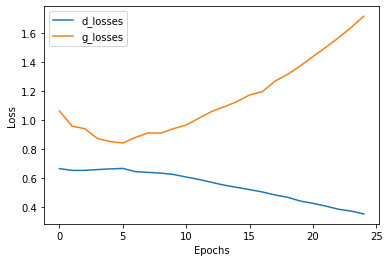

In [21]:
plt.plot(train_losses_D_e, label='d_losses')
plt.plot(train_losses_G_e, label='g_losses')
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**


For non-GAN models we have seen that as loss goes down accuracy goes up. But with GANs the **generator and discriminator** are constantly **trying to "one-up" each other**. As a result **the loss functions for both** Genrator and Discriminator **look like noise**, and if we look at loss per iteration nothing much is happening. But in fact b**oth the generator and discriminator are improving**, and ideally they should **improve at the same rate**. This is indeed what was observed up to epoch 15-20, after which I observed some relatively non-extreme **divergence** (losses are still contained with discriminator average loss per epoch below 2). This indicates that the **learning rate will need to potentially decrease** in that stage of training and some other methods like **Dropouts** need to be introduced to the Discriminator to make it less good at recognising fake images.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [ ]:
# Any additional code

### Discussion
**Mode Collapse** occurs when the generator produces the **same output for the multiple inputs**. The generator does not learn the full distribution but only a few classes. 

In the final model I **did not observe a mode** collapse, as the output features **multiple classes of images**. I however have observed mode collapse when experimenting with the architecture - please refer to the Engineering choices section.


To mitigate mode collapse the following things were implemented:

*   Sufficiently **large latent space (100)** so that the generator is flexible enough to encode multiple modes
*   Making sure that the **learning rate was sufficiently tuned** to escape local minima in early stages of training
*   Introducing **learning rate decay** is likely to be another solution to avoid mode collapse. All my attempts to introudce l.r. decay were neutral /negative for the performance.

Please find below an example of mode collapse during training:

**Mode collapse**

<img src="https://drive.google.com/uc?id=1xeltOGf9hFbFkpSQA5Fe4zfbZv1-cKxp">






**YOUR ANSWER**



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [22]:
# # If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing
!cd /content/drive/MyDrive/dl_cw_2/

In [23]:
!pip install -q torch torchvision

In [24]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [25]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
    lambda x : x.round() # to binarise the image data
])

def vae_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = (x+1)/2 #unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x
gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [26]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw



In [27]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

/content/drive/MyDrive/dl_cw_2
Used CNN


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


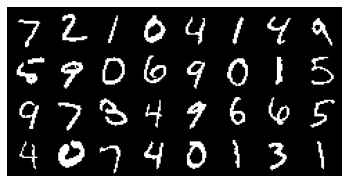

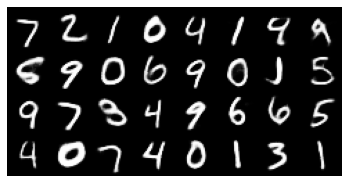

In [28]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
%cd /content/drive/MyDrive/dl_cw_2/
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

/content/drive/MyDrive/dl_cw_2
Number of Parameters is 6214144 which is ok


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


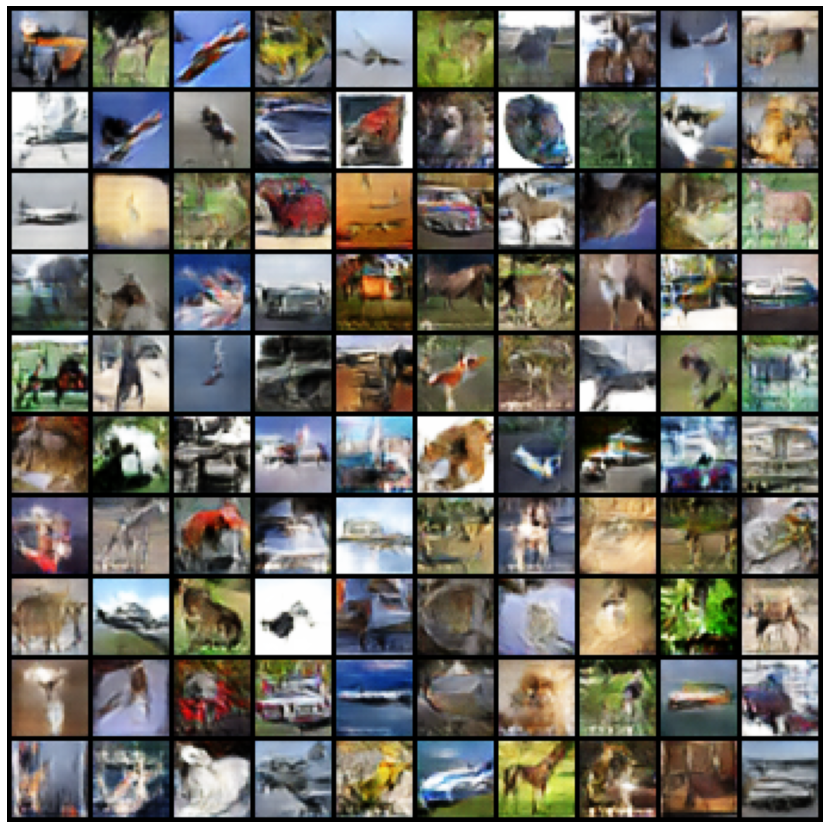

In [29]:
# GAN Tests
%cd /content/drive/MyDrive/dl_cw_2/
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)